In [343]:
import numpy as np
import numpy.matlib
from matplotlib import pyplot as plt
import math
import time
from keras.datasets import mnist

In [344]:
#Load and Used the flattened (that is 1D) array of pixels of each image as a feature vector

n_samples = 100

# Load MNIST data

(train_images, train_labels), (test_images, test_labels) = mnist.load_data()

train_images = train_images[:n_samples]
train_labels = train_labels[:n_samples]

test_images = test_images[:n_samples]
test_labels = test_labels[:n_samples]

# Flatten the images
train_images_flattened = train_images.reshape(train_images.shape[0], -1) /255.0
test_images_flattened = test_images.reshape(test_images.shape[0], -1) / 255.0


In [345]:
def getEuclideanDistance(single_point,array):
    nrows, ncols, nfeatures=array.shape[0],array.shape[1], array.shape[2]
    points=array.reshape((nrows*ncols,nfeatures))
                         
    dist = (points - single_point)**2
    dist = np.sum(dist, axis=1)
    dist = np.sqrt(dist)

    dist=dist.reshape((nrows,ncols))
    return dist

In [346]:

mu, sigma = 0, 0.1
A = np.random.normal(mu, sigma, 10)
#A.shape, A

In [347]:
nrows,ncols,nfeatures=3,3,3

#Generate coordinate system
x,y=np.meshgrid(range(ncols),range(nrows))

In [348]:

sgm0=2
sgmdecay=0.05
t=1
sgm = sgm0 * math.exp(-t*sgmdecay);

width = math.ceil(sgm*3)

dist=np.array([[2,1,3],[3,2,3],[4,4,4]])
bmurow, bmucol =np.unravel_index(np.argmin(dist, axis=None), dist.shape) 

g = np.exp(-((np.power(x - bmucol,2)) + (np.power(y - bmurow,2))) / (2*sgm*sgm));


fromrow = max(0,bmurow - width);
torow   = min(bmurow + width,nrows);
fromcol = max(0,bmucol - width);
tocol   = min(bmucol + width,ncols);



In [349]:
G = np.dstack([g[fromrow:torow,fromcol:tocol]]*nfeatures);



In [350]:
def visualize_som(som, nrows, ncols, dispRes, message):
    print("\n" + message + "\n")
    fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,15))
    for k in range(nrows):
        for l in range(ncols):
            A = som[k, l, :].reshape(dispRes)
            ax[k, l].imshow(A, cmap="plasma")
            ax[k, l].set_yticks([])
            ax[k, l].set_xticks([])
    plt.show()


In [351]:
def SOM (dispRes, trainingData, ndim=10, nepochs=10, eta0=0.1, etadecay=0.05, sgm0=20, sgmdecay=0.05, showMode=0):
    nfeatures=trainingData.shape[1]
    ntrainingvectors=trainingData.shape[0]
    
    nrows = ndim
    ncols = ndim
    
    mu, sigma = 0, 0.1
    numpy.random.seed(int(time.time()))
    som = np.random.normal(mu, sigma, (nrows,ncols,nfeatures))

    if showMode >= 1:
        print("\nSOM features before training: \n")         
        
        fig, ax=plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,15))
        
        for k in range(nrows):
            for l in range (ncols):
                A=som[k,l,:].reshape((dispRes[0],dispRes[1]))
                ax[k,l].imshow(A,cmap="plasma")
                ax[k,l].set_yticks([])
                ax[k,l].set_xticks([])   
    
    #Generate coordinate system
    x,y=np.meshgrid(range(ncols),range(nrows))
    
    if showMode>=1:
        #Added visualazation on the SOM weights at start when showmode => 1
        visualize_som(som, nrows,ncols,dispRes, 'at the Beginning')       
    
    for t in range (1,nepochs+1):
        #Compute the learning rate for the current epoch
        eta = eta0 * math.exp(-t*etadecay);
        
        #Compute the variance of the Gaussian (Neighbourhood) function for the ucrrent epoch
        sgm = sgm0 * math.exp(-t*sgmdecay);
        
        #Consider the width of the Gaussian function as 3 sigma
        width = math.ceil(sgm*3);
        
        for ntraining in range(ntrainingvectors):
            trainingVector = trainingData[ntraining,:];
            
            # Compute the Euclidean distance between the training vector and
            # each neuron in the SOM map
            dist = getEuclideanDistance(trainingVector, som);
       
            # Find 2D coordinates of the Best Matching Unit (bmu)
            bmurow, bmucol =np.unravel_index(np.argmin(dist, axis=None), dist.shape) ;
            
            
            #Generate a Gaussian function centered on the location of the bmu
            g = np.exp(-((np.power(x - bmucol,2)) + (np.power(y - bmurow,2))) / (2*sgm*sgm));

            #Determine the boundary of the local neighbourhood
            fromrow = max(0,bmurow - width);
            torow   = min(bmurow + width,nrows);
            fromcol = max(0,bmucol - width);
            tocol   = min(bmucol + width,ncols);

            
            #Get the neighbouring neurons and determine the size of the neighbourhood
            neighbourNeurons = som[fromrow:torow,fromcol:tocol,:];
            sz = neighbourNeurons.shape;
            
            #Transform the training vector and the Gaussian function into 
            # multi-dimensional to facilitate the computation of the neuron weights update
            T = np.matlib.repmat(trainingVector,sz[0]*sz[1],1).reshape((sz[0],sz[1],nfeatures));                   
            G = np.dstack([g[fromrow:torow,fromcol:tocol]]*nfeatures);

            # Update the weights of the neurons that are in the neighbourhood of the bmu
            neighbourNeurons = neighbourNeurons + eta * G * (T - neighbourNeurons);

            
            #Put the new weights of the BMU neighbouring neurons back to the
            #entire SOM map
            som[fromrow:torow,fromcol:tocol,:] = neighbourNeurons;
        
        if t == nepochs // 2:
            if showMode>=1:
                #Added visualazation on the SOM weights at half way when showmode => 1
                visualize_som(som, nrows,ncols,dispRes, 'Halfway Through')
        
    if showMode>=1:
        #Added visualazation on the SOM weights at end when showmode => 1
        visualize_som(som, nrows,ncols,dispRes, 'at the End')
    
    if showMode >= 1:
        print("\nSOM features AFTER training: \n")
        
        fig, ax=plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,15))
        
        for k in range(nrows):
            for l in range (ncols):
                A=som[k,l,:].reshape((dispRes[0],dispRes[1]))
                ax[k,l].imshow(A,cmap="plasma")
                ax[k,l].set_yticks([])
            ax[k,l].set_xticks([])   
    return som
    

In [352]:
import pandas as pd
def parse_input_zoo_data(filename, header='infer'):

    input_data = pd.read_csv(filename, header=header)

    classes = input_data[17].tolist()
    labels = input_data[0].tolist()
    input_database = {
        0: input_data[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]].to_numpy()
    }

    return input_database, labels, classes


SOM features before training: 


at the Beginning



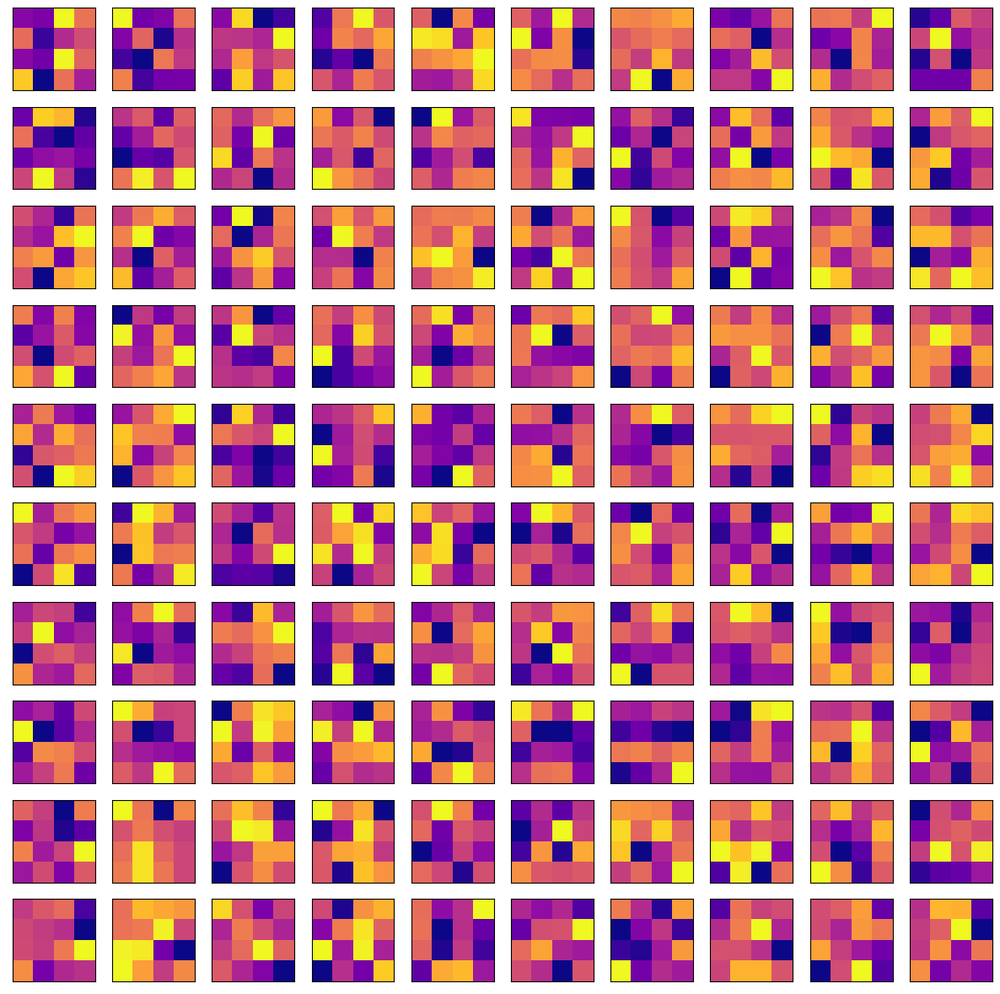

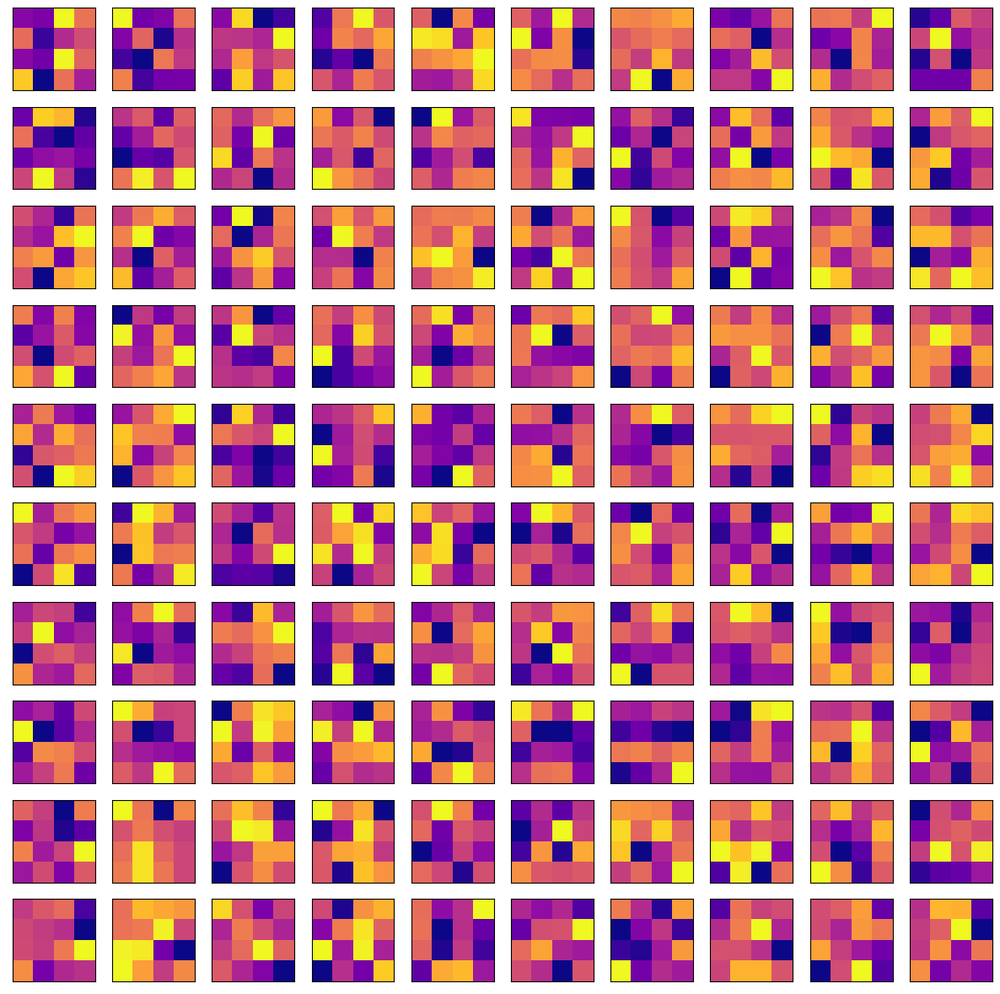


Halfway Through



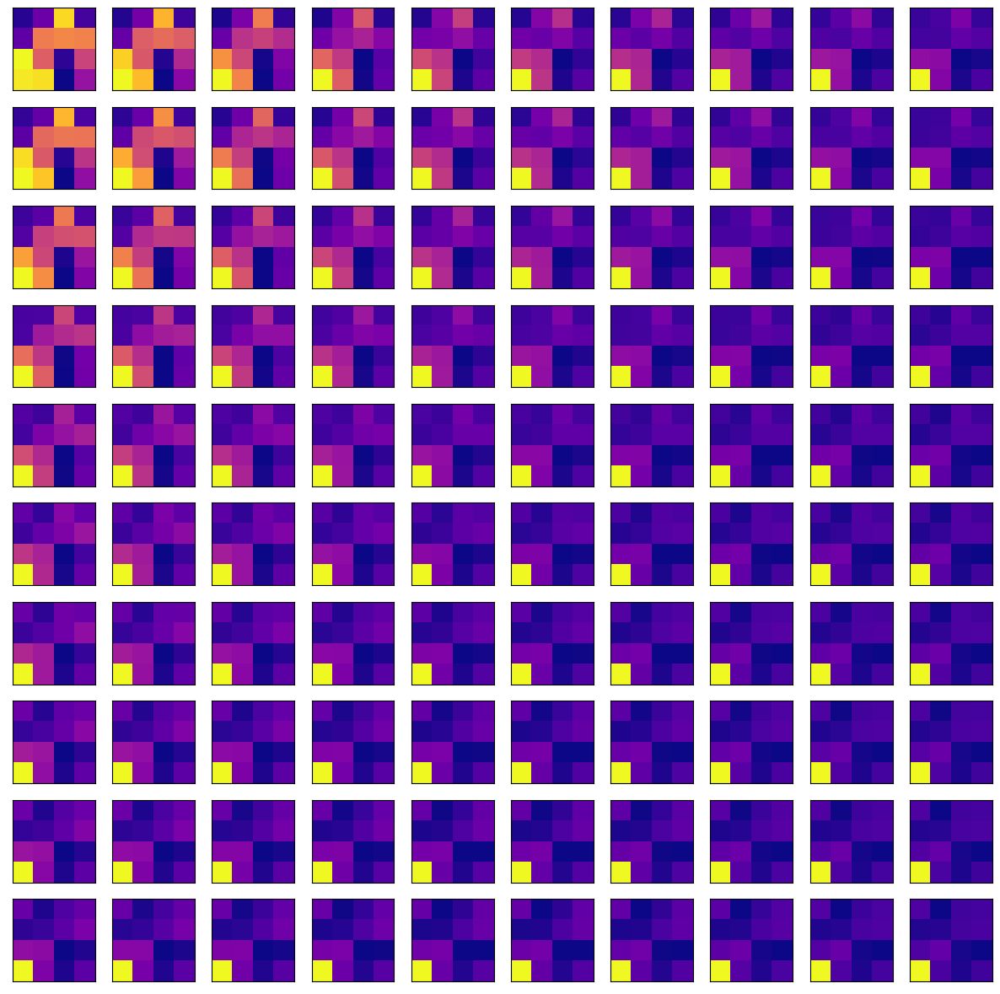


at the End



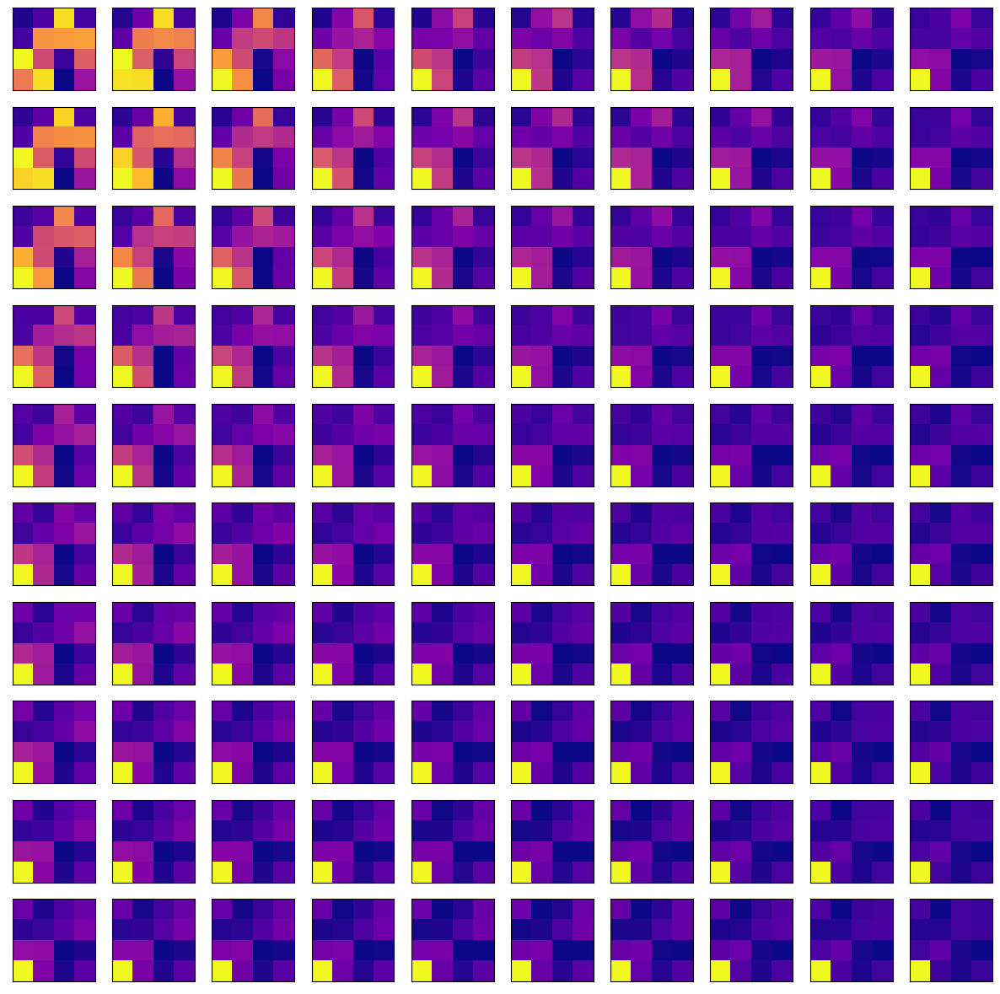


SOM features AFTER training: 



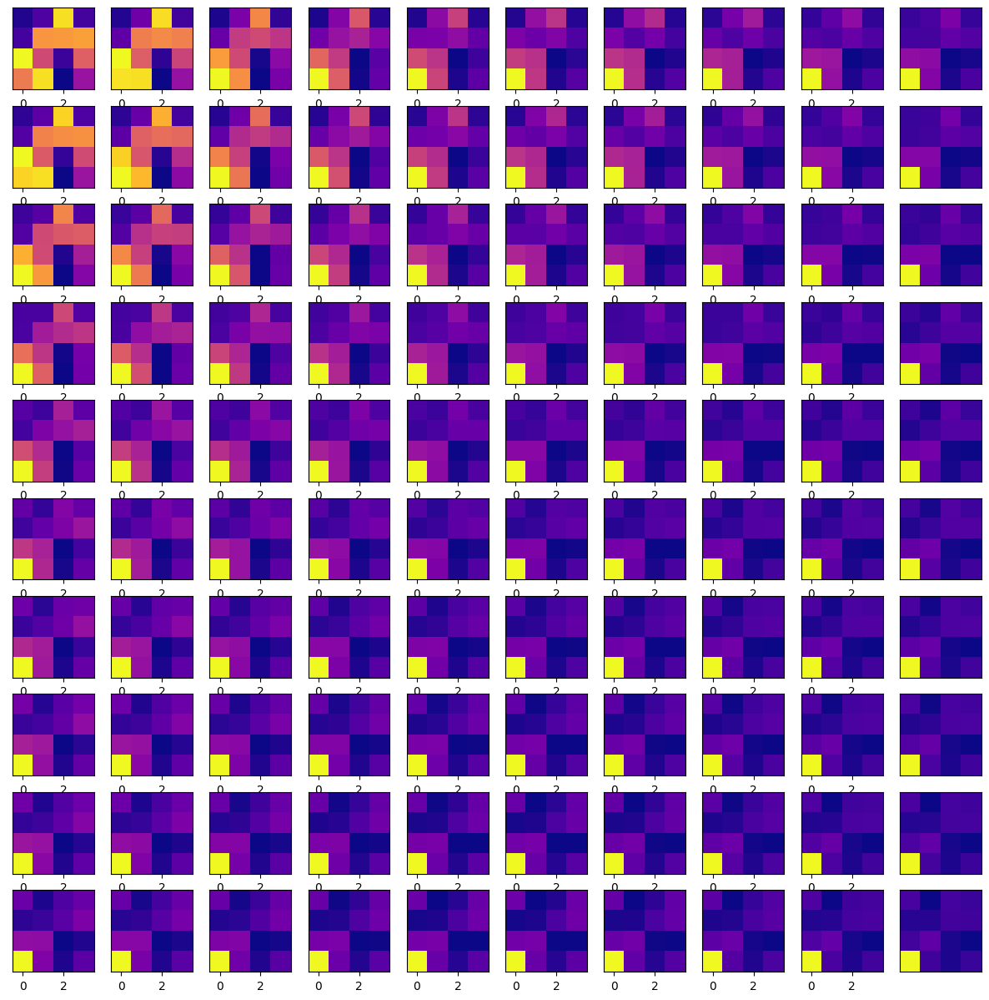

In [353]:
input_filename = 'zoo.txt'
input_vector_database, labels, classes = parse_input_zoo_data(input_filename,None)

epoch=100 

som_trained=SOM ([4,4],input_vector_database[0], ndim=10, nepochs=epoch, eta0=0.01, etadecay=0.05, sgm0=20, sgmdecay=0.05, showMode=1)
plt.show()

Training SOM with grid size: 20x20

SOM features before training: 


at the Beginning



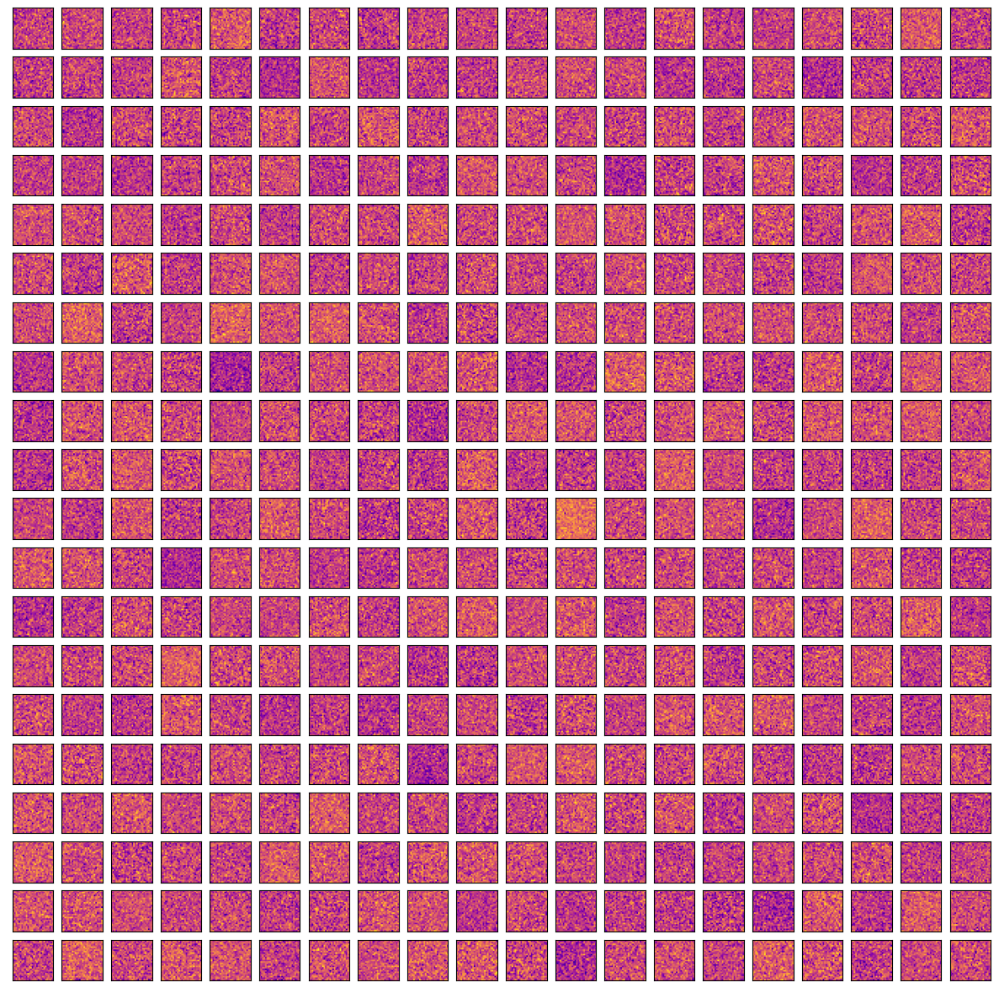

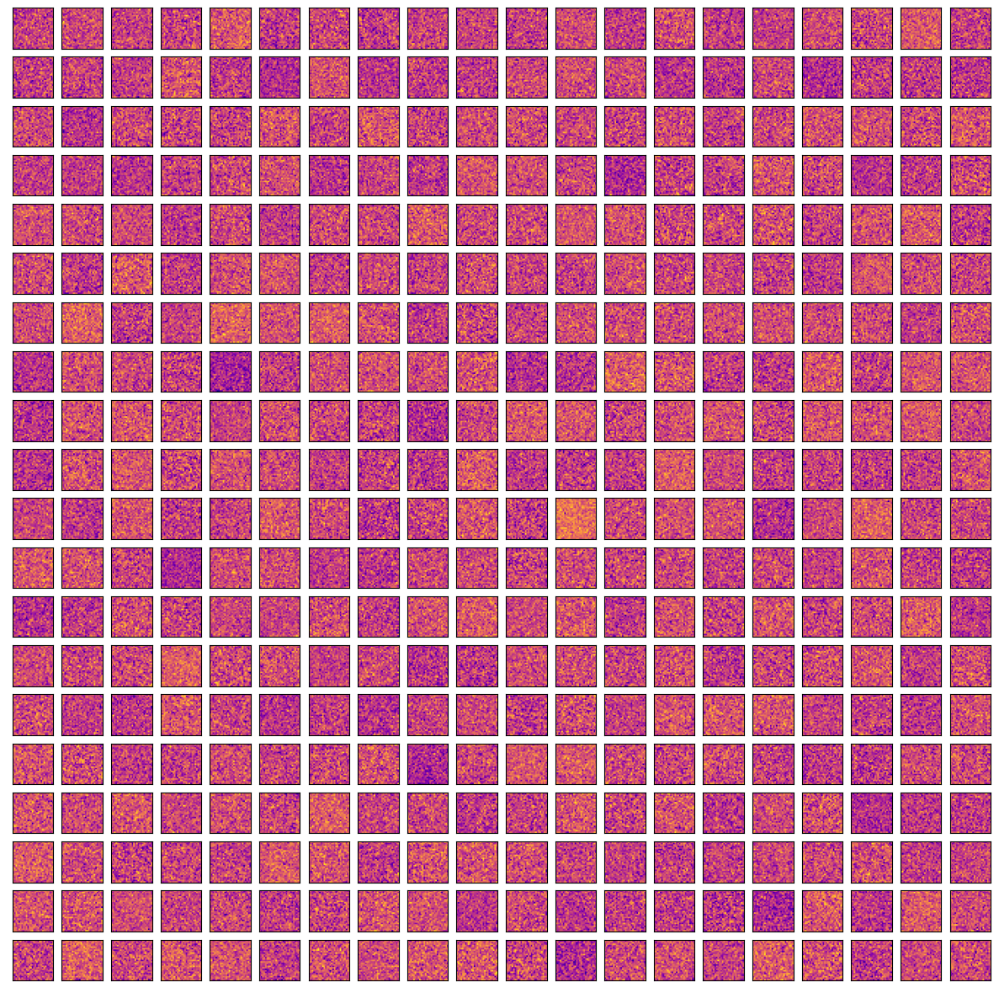


Halfway Through



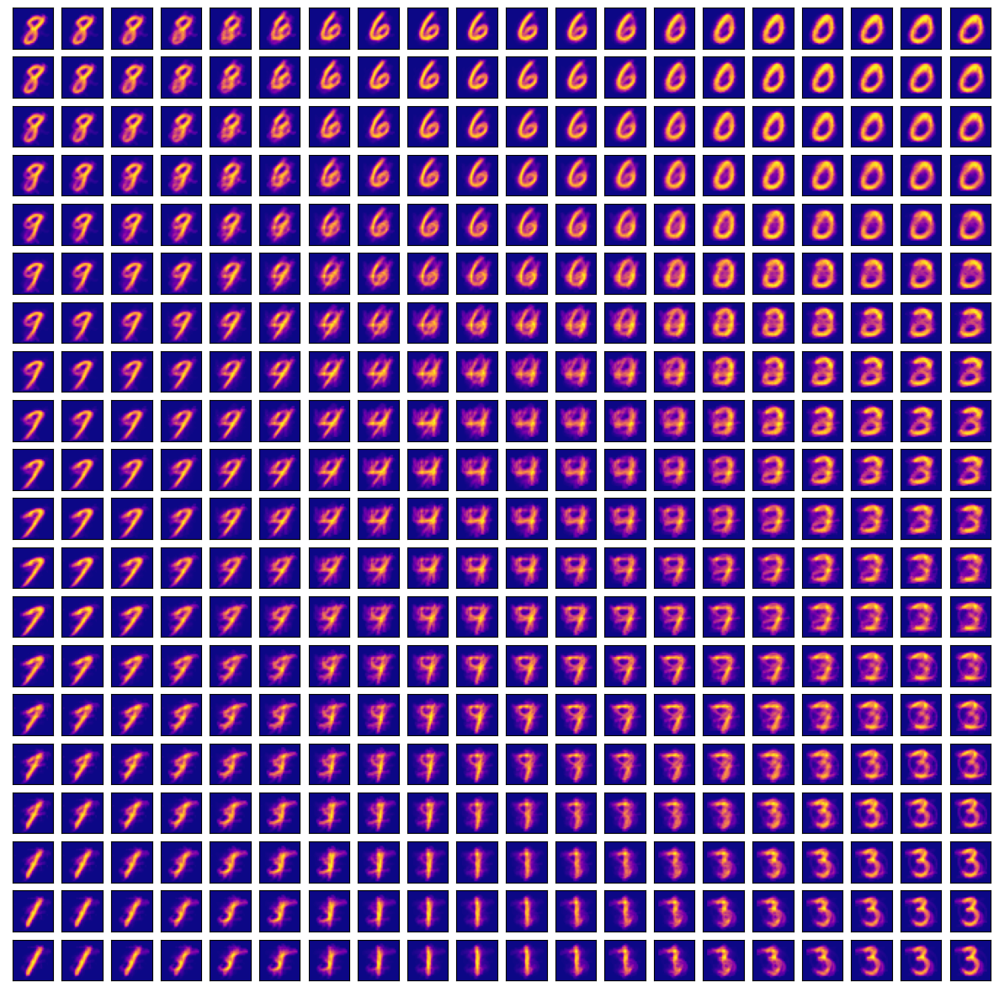


at the End



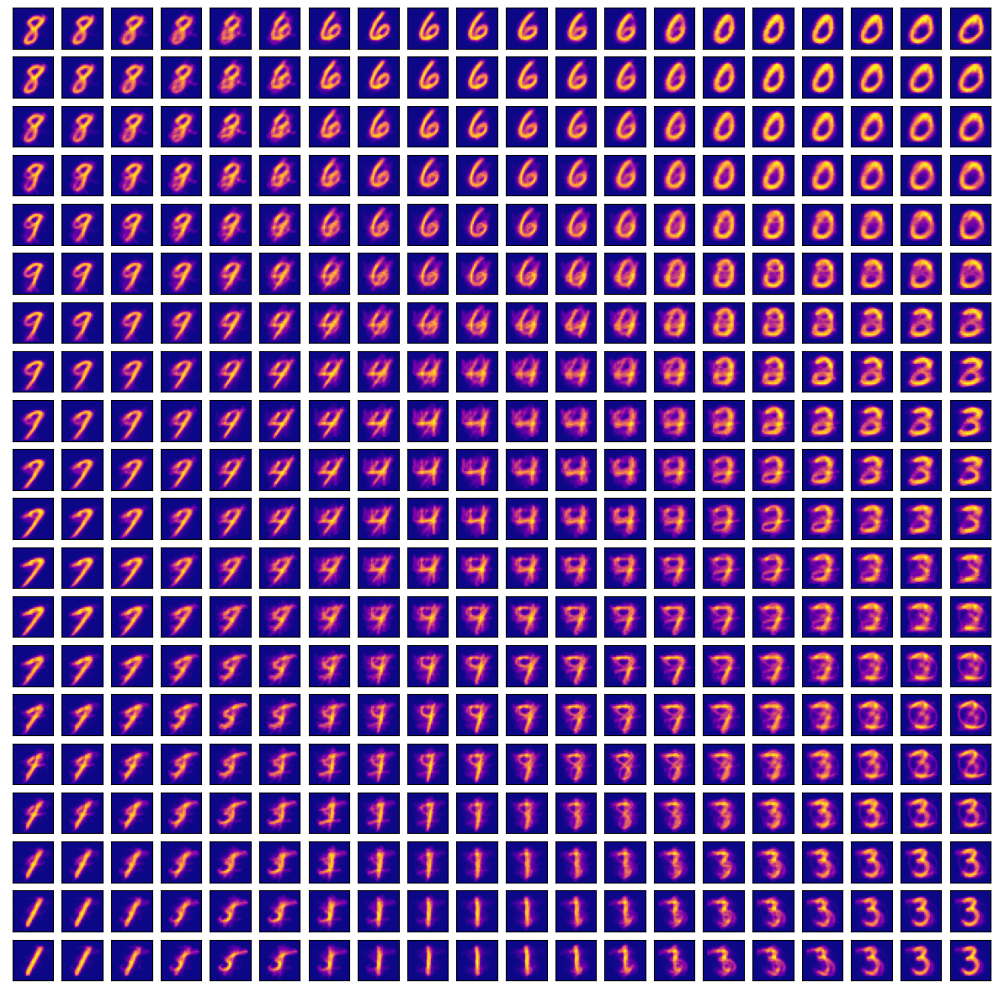


SOM features AFTER training: 



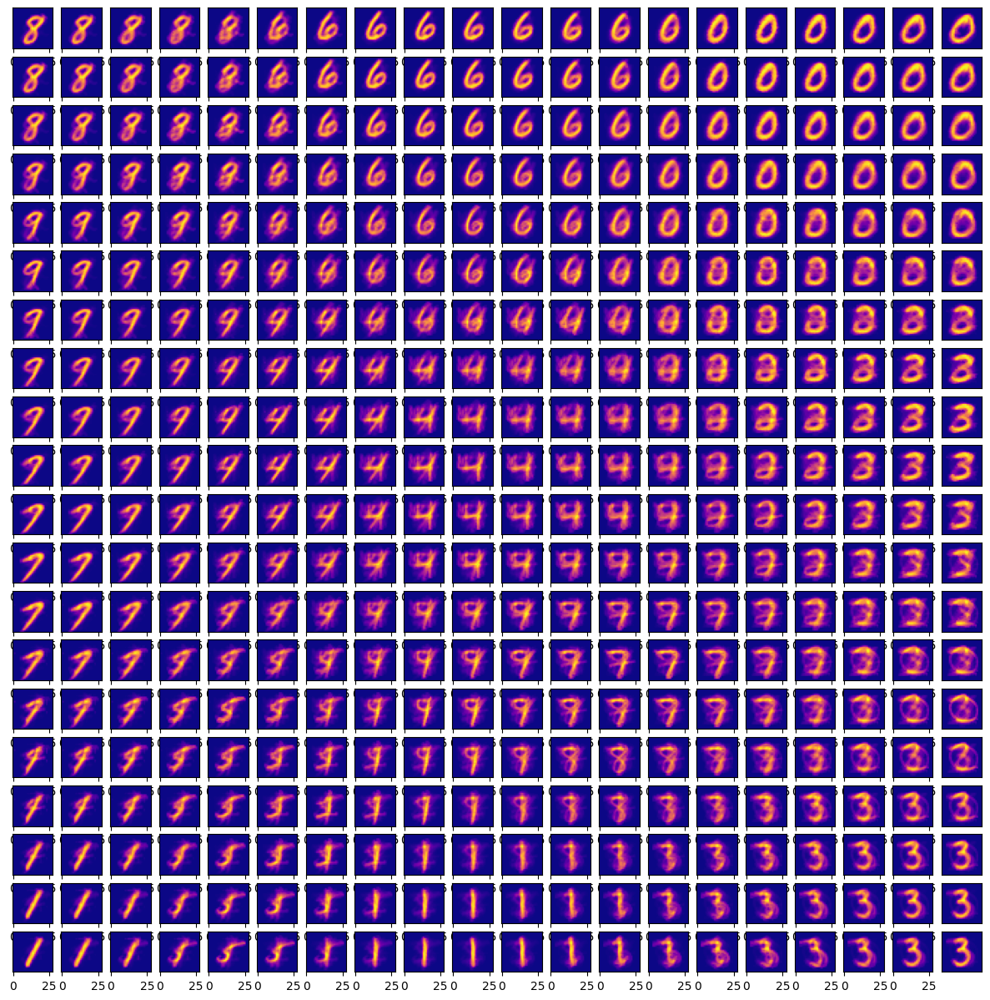

In [354]:
#train SOM with grid 20x20, 40x40, 80x80 # grid_sizes = [20, 40, 80]



print("Training SOM with grid size: 20x20")
som_trained_20x20 = SOM(dispRes=[28, 28], trainingData=train_images_flattened, ndim=20, nepochs=epoch, eta0=0.1, etadecay=0.05, sgm0=20, sgmdecay=0.05, showMode=1)
#print("Training SOM with grid size: 40x40")
#som_trained_40x40 = SOM(dispRes=[28, 28], trainingData=train_images_flattened, ndim=40, nepochs=epoch, eta0=0.1, etadecay=0.05, sgm0=20, sgmdecay=0.05, showMode=1)
#print("Training SOM with grid size: 80x80")
#som_trained_80x80 = SOM(dispRes=[28, 28], trainingData=train_images_flattened, ndim=80, nepochs=epoch, eta0=0.1, etadecay=0.05, sgm0=20, sgmdecay=0.05, showMode=1)



In [355]:
#som_trained=SOM ([4,4],input_vector_database[0], ndim=10, nepochs=100, eta0=0.01, etadecay=0.05, sgm0=20, sgmdecay=0.05, showMode=1)


In [356]:
plt.show()


In [357]:
#verification of correctness on the training set:



def SOM_Test (trainingData, som_, classes, grid_, ConfusionMatrix, ndim=60):
    nfeatures=trainingData.shape[1]
    ntrainingvectors=trainingData.shape[0]
    
    nrows = ndim
    ncols = ndim
    
    nclasses=np.max(classes)

    som_cl=np.zeros((ndim,ndim,nclasses+1))
    
    
    for ntraining in range(ntrainingvectors):
        trainingVector = trainingData[ntraining,:];
        class_of_sample= classes[ntraining]    
        # Compute the Euclidean distance between the training vector and
        # each neuron in the SOM map
        dist = getEuclideanDistance(trainingVector, som_);
       
        # Find 2D coordinates of the Best Matching Unit (bmu)
        bmurow, bmucol =np.unravel_index(np.argmin(dist, axis=None), dist.shape) ;
        
        
        som_cl[bmurow, bmucol,class_of_sample]=som_cl[bmurow, bmucol,class_of_sample]+1
    
    
    
    for i in range (nrows):
        for j in range (ncols):
            grid_[i,j]=np.argmax(som_cl[i,j,:])

 
    for ntraining in range(ntrainingvectors):
        trainingVector = trainingData[ntraining,:];
        class_of_sample= classes[ntraining]    
        # Compute the Euclidean distance between the training vector and
        # each neuron in the SOM map
        dist = getEuclideanDistance(trainingVector, som_);
       
        # Find 2D coordinates of the Best Matching Unit (bmu)
        bmurow, bmucol =np.unravel_index(np.argmin(dist, axis=None), dist.shape) ;
        
        predicted=np.argmax(som_cl[bmurow, bmucol,:])
        ConfusionMatrix[class_of_sample-1, predicted-1]=ConfusionMatrix[class_of_sample-1, predicted-1]+1
        
    return grid_, ConfusionMatrix
    



In [358]:

#ndim=20
#nrows=ndim
#ncols=ndim
#grid_color=np.zeros((nrows,ncols))
#nclasses=np.max(classes)

#Confusion_Matrix=np.zeros((nclasses,nclasses))
#grid_color,Confusion_Matrix_test=SOM_Test (test_images_flattened, som_trained_20x20, classes, grid_color, Confusion_Matrix, ndim)
#grid_color,Confusion_Matrix_train=SOM_Test (train_images_flattened, som_trained_20x20, classes, grid_color, Confusion_Matrix, ndim)

def Confusion_Matrix(data, som_model, ndim):
    nrows = ncols = ndim
    grid_color = np.zeros((nrows, ncols))
    nclasses = np.max(classes)
    confusion_matrix = np.zeros((nclasses, nclasses))

    grid_color, confusion_matrix = SOM_Test(data, som_model, classes, grid_color, confusion_matrix, ndim)

    plt.close()
    plt.imshow(grid_color)
    plt.show()

    return confusion_matrix, train_images_flattened.shape, np.sum(confusion_matrix)

#def getConfusionMatrix(train_images, SOM, ndim=20):
 #   nrows=ndim
  #  ncols=ndim
   # grid_color=np.zeros((nrows,ncols))
   # nclasses=np.max(classes)

#    Confusion_Matrix=np.zeros((nclasses,nclasses))
 #   grid_color,Confusion_Matrix=SOM_Test (train_images, SOM, classes, grid_color, Confusion_Matrix, ndim)

#    plt.close()
#    plt.imshow(grid_color)
#    plt.show()

 #   return Confusion_Matrix, train_images_flattened.shape, np.sum(Confusion_Matrix)


In [359]:
#Confusion_Matrix, input_vector_database[0].shape, np.sum(Confusion_Matrix)

In [360]:
def calulateAccuracy(Confusion_Matrix):
    true_positives = np.trace(Confusion_Matrix)

    total_samples = np.sum(Confusion_Matrix)

    # total acc
    accuracy = true_positives / total_samples
    
    print("Accuracy:", accuracy)


confusion matrix on train data set


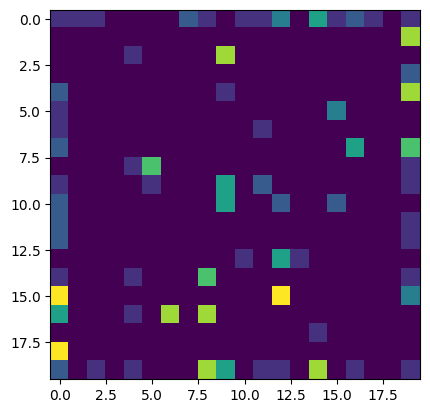

[[40.  1.  0.  0.  0.  0.  0.]
 [ 4. 15.  0.  0.  0.  0.  0.]
 [ 1.  1.  3.  0.  0.  0.  0.]
 [ 5.  1.  0.  7.  0.  0.  0.]
 [ 1.  0.  0.  0.  3.  0.  0.]
 [ 1.  0.  0.  0.  0.  7.  0.]
 [ 2.  3.  0.  1.  0.  1.  3.]]
Accuracy: 0.78
confusion matrix on test data set


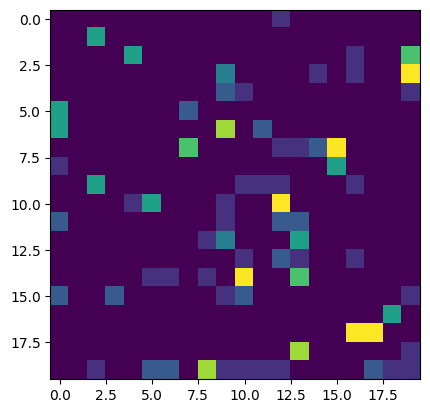

[[40.  0.  0.  0.  0.  0.  1.]
 [ 5. 14.  0.  0.  0.  0.  0.]
 [ 3.  0.  2.  0.  0.  0.  0.]
 [ 2.  1.  0. 10.  0.  0.  0.]
 [ 1.  0.  0.  0.  3.  0.  0.]
 [ 2.  1.  0.  1.  0.  4.  0.]
 [ 1.  0.  1.  0.  0.  1.  7.]]


In [361]:
#Task 5
print("confusion matrix on train data set")
confusion_matrix, shape, sum_matrix = Confusion_Matrix(train_images_flattened, som_trained_20x20, 20)
print(confusion_matrix)
calulateAccuracy(confusion_matrix)

print("confusion matrix on test data set")
confusion_matrix, shape, sum_matrix = Confusion_Matrix(test_images_flattened, som_trained_20x20, 20)
print(confusion_matrix)

      learning rate: 0.01    


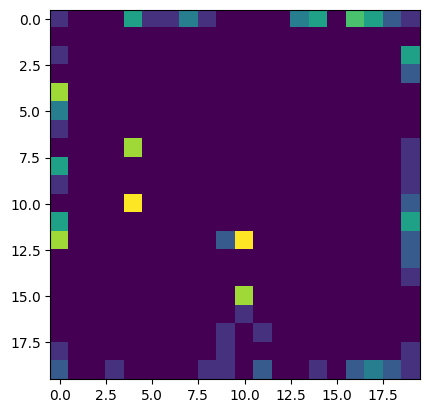

[[38.  3.  0.  0.  0.  0.  0.]
 [ 5. 14.  0.  0.  0.  0.  0.]
 [ 1.  0.  4.  0.  0.  0.  0.]
 [ 4.  2.  0.  7.  0.  0.  0.]
 [ 1.  1.  0.  0.  1.  1.  0.]
 [ 1.  1.  1.  0.  0.  5.  0.]
 [ 2.  3.  1.  1.  0.  1.  2.]]
Accuracy: 0.71
      learning rate: 0.1    


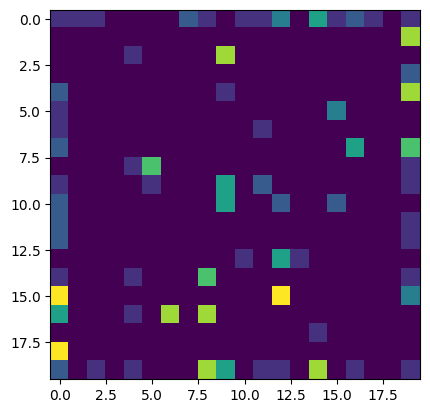

[[40.  1.  0.  0.  0.  0.  0.]
 [ 4. 15.  0.  0.  0.  0.  0.]
 [ 1.  1.  3.  0.  0.  0.  0.]
 [ 5.  1.  0.  7.  0.  0.  0.]
 [ 1.  0.  0.  0.  3.  0.  0.]
 [ 1.  0.  0.  0.  0.  7.  0.]
 [ 2.  3.  0.  1.  0.  1.  3.]]
Accuracy: 0.78
      learning rate: 0.2    


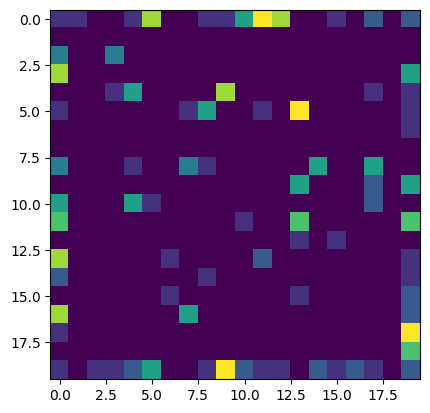

[[40.  1.  0.  0.  0.  0.  0.]
 [ 4. 15.  0.  0.  0.  0.  0.]
 [ 0.  1.  4.  0.  0.  0.  0.]
 [ 1.  0.  0. 12.  0.  0.  0.]
 [ 0.  0.  0.  0.  4.  0.  0.]
 [ 1.  1.  0.  0.  0.  6.  0.]
 [ 3.  2.  0.  0.  0.  1.  4.]]
Accuracy: 0.85
      learning rate: 0.3    


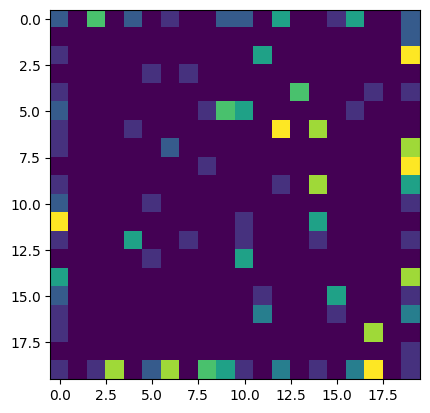

[[40.  1.  0.  0.  0.  0.  0.]
 [ 5. 14.  0.  0.  0.  0.  0.]
 [ 0.  1.  4.  0.  0.  0.  0.]
 [ 1.  0.  0. 12.  0.  0.  0.]
 [ 0.  0.  0.  0.  4.  0.  0.]
 [ 1.  0.  0.  0.  0.  7.  0.]
 [ 2.  1.  0.  1.  1.  0.  5.]]
Accuracy: 0.86
      learning rate: 0.4    


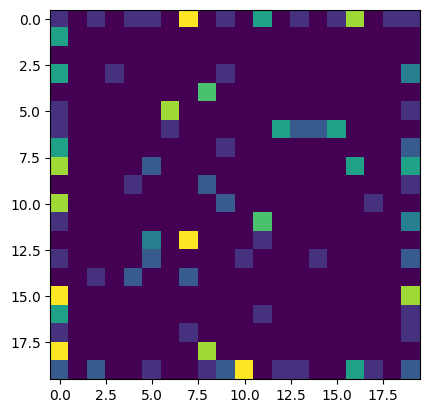

[[39.  2.  0.  0.  0.  0.  0.]
 [ 3. 16.  0.  0.  0.  0.  0.]
 [ 2.  0.  3.  0.  0.  0.  0.]
 [ 3.  0.  0. 10.  0.  0.  0.]
 [ 1.  0.  1.  0.  2.  0.  0.]
 [ 0.  1.  0.  1.  0.  6.  0.]
 [ 1.  1.  1.  1.  0.  1.  5.]]
Accuracy: 0.81
      learning rate: 0.5    


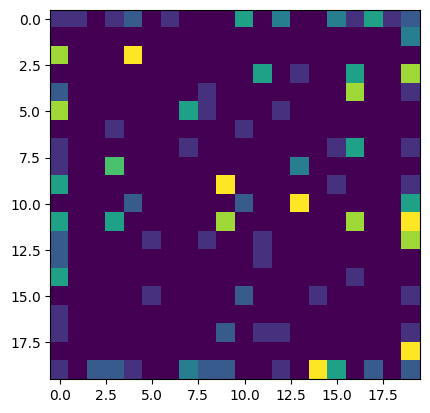

[[40.  1.  0.  0.  0.  0.  0.]
 [ 2. 17.  0.  0.  0.  0.  0.]
 [ 0.  0.  5.  0.  0.  0.  0.]
 [ 1.  0.  0. 12.  0.  0.  0.]
 [ 2.  0.  0.  1.  1.  0.  0.]
 [ 1.  0.  0.  0.  0.  7.  0.]
 [ 0.  2.  1.  0.  0.  1.  6.]]
Accuracy: 0.88
      learning rate: 0.6    


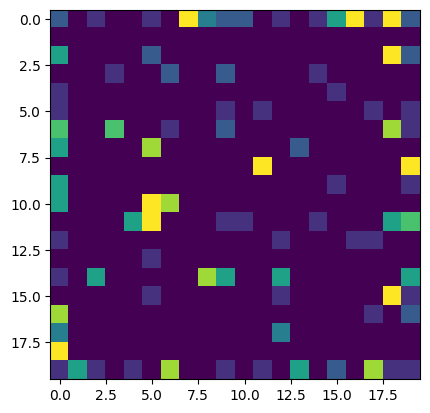

[[40.  1.  0.  0.  0.  0.  0.]
 [ 4. 15.  0.  0.  0.  0.  0.]
 [ 2.  0.  3.  0.  0.  0.  0.]
 [ 0.  0.  0. 13.  0.  0.  0.]
 [ 1.  0.  0.  0.  3.  0.  0.]
 [ 0.  1.  0.  0.  0.  7.  0.]
 [ 0.  0.  0.  0.  0.  0. 10.]]
Accuracy: 0.91
      learning rate: 0.7    


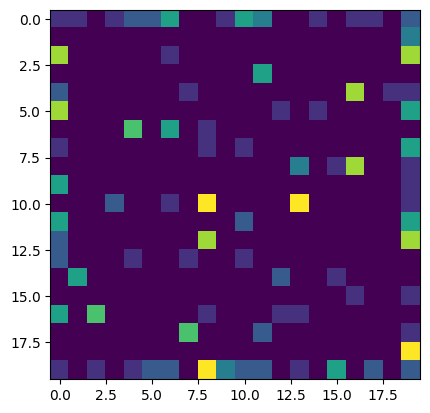

[[40.  1.  0.  0.  0.  0.  0.]
 [ 2. 17.  0.  0.  0.  0.  0.]
 [ 1.  0.  4.  0.  0.  0.  0.]
 [ 1.  0.  0. 12.  0.  0.  0.]
 [ 1.  0.  0.  0.  3.  0.  0.]
 [ 1.  0.  0.  0.  0.  7.  0.]
 [ 0.  3.  0.  2.  0.  1.  4.]]
Accuracy: 0.87
      learning rate: 0.8    


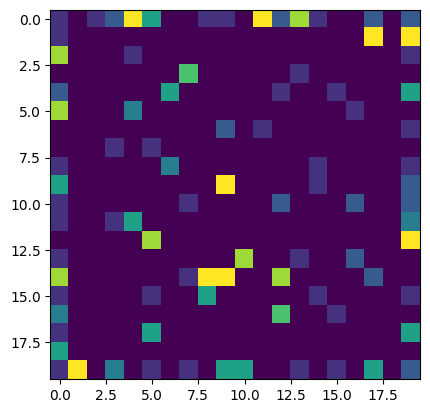

[[40.  1.  0.  0.  0.  0.  0.]
 [ 3. 16.  0.  0.  0.  0.  0.]
 [ 0.  0.  5.  0.  0.  0.  0.]
 [ 1.  0.  0. 12.  0.  0.  0.]
 [ 2.  0.  0.  0.  2.  0.  0.]
 [ 0.  0.  1.  0.  0.  7.  0.]
 [ 0.  0.  0.  1.  0.  0.  9.]]
Accuracy: 0.91
      learning rate: 0.9    


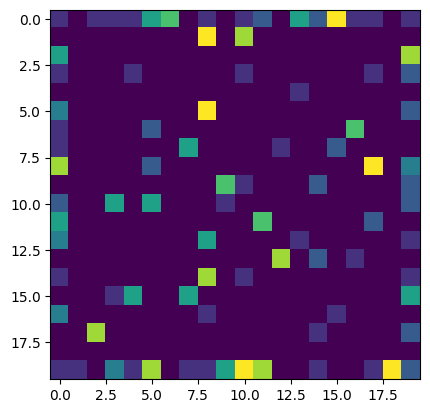

[[40.  1.  0.  0.  0.  0.  0.]
 [ 3. 16.  0.  0.  0.  0.  0.]
 [ 0.  0.  5.  0.  0.  0.  0.]
 [ 1.  0.  0. 12.  0.  0.  0.]
 [ 0.  0.  0.  0.  4.  0.  0.]
 [ 0.  0.  0.  0.  0.  8.  0.]
 [ 0.  1.  1.  1.  0.  1.  6.]]
Accuracy: 0.91
      learning rate: 0.99    


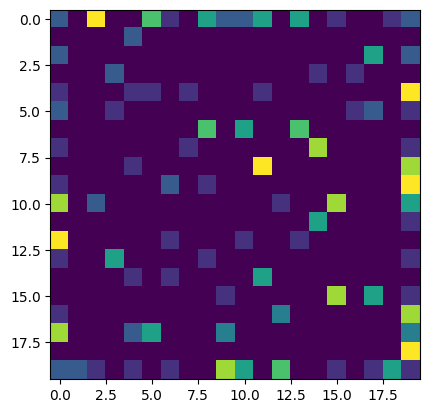

[[41.  0.  0.  0.  0.  0.  0.]
 [ 3. 16.  0.  0.  0.  0.  0.]
 [ 1.  1.  3.  0.  0.  0.  0.]
 [ 0.  0.  0. 13.  0.  0.  0.]
 [ 0.  0.  0.  0.  4.  0.  0.]
 [ 0.  0.  0.  0.  0.  8.  0.]
 [ 1.  2.  0.  1.  0.  0.  6.]]
Accuracy: 0.91


In [362]:
# Task 6

# learning rates
learning_rates = [0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6,0.7,0.8,0.9,0.99]

for learning_rates in learning_rates:
    print(f"      learning rate: {learning_rates}    ")
    som = SOM([28, 28], train_images_flattened, ndim=20, nepochs=100, eta0=learning_rates, etadecay=0.05, sgm0=20, sgmdecay=0.05, showMode=0)
    confusion_matrix, shape, sum_matrix = Confusion_Matrix(train_images_flattened, som, 20)

    print(confusion_matrix)
    calulateAccuracy(confusion_matrix)    



Question 6: What is the resulting effect of increasing and decreasing the learning rate of
SOM? 

Answer: It seems that a learning rate of 0.6 and all values above 0.8 yield the highest accuracy, and that the accuracy plateaus around 91%. 

      exponential decay value: 0.01    


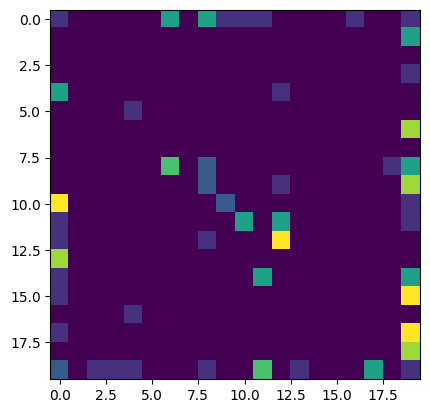

Accuracy: 0.68
[[38.  3.  0.  0.  0.  0.  0.]
 [10.  9.  0.  0.  0.  0.  0.]
 [ 4.  1.  0.  0.  0.  0.  0.]
 [ 2.  0.  0. 11.  0.  0.  0.]
 [ 1.  1.  0.  0.  2.  0.  0.]
 [ 3.  0.  0.  0.  1.  4.  0.]
 [ 5.  1.  0.  0.  0.  0.  4.]]
      exponential decay value: 0.2    


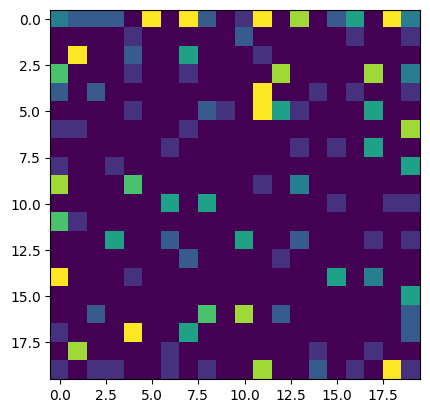

Accuracy: 0.99
[[41.  0.  0.  0.  0.  0.  0.]
 [ 1. 18.  0.  0.  0.  0.  0.]
 [ 0.  0.  5.  0.  0.  0.  0.]
 [ 0.  0.  0. 13.  0.  0.  0.]
 [ 0.  0.  0.  0.  4.  0.  0.]
 [ 0.  0.  0.  0.  0.  8.  0.]
 [ 0.  0.  0.  0.  0.  0. 10.]]
      exponential decay value: 0.5    


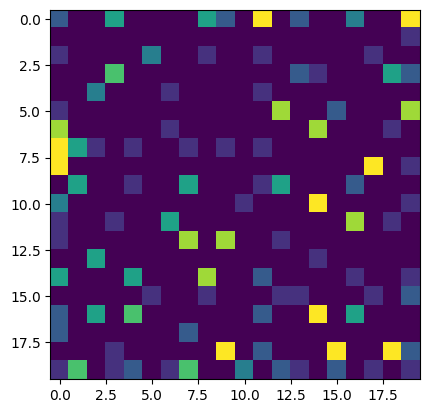

Accuracy: 0.99
[[41.  0.  0.  0.  0.  0.  0.]
 [ 1. 18.  0.  0.  0.  0.  0.]
 [ 0.  0.  5.  0.  0.  0.  0.]
 [ 0.  0.  0. 13.  0.  0.  0.]
 [ 0.  0.  0.  0.  4.  0.  0.]
 [ 0.  0.  0.  0.  0.  8.  0.]
 [ 0.  0.  0.  0.  0.  0. 10.]]
      exponential decay value: 0.9    


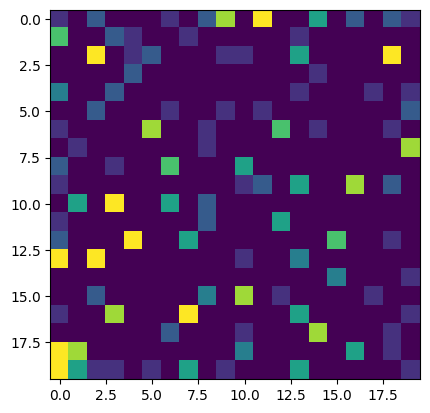

Accuracy: 0.99
[[41.  0.  0.  0.  0.  0.  0.]
 [ 1. 18.  0.  0.  0.  0.  0.]
 [ 0.  0.  5.  0.  0.  0.  0.]
 [ 0.  0.  0. 13.  0.  0.  0.]
 [ 0.  0.  0.  0.  4.  0.  0.]
 [ 0.  0.  0.  0.  0.  8.  0.]
 [ 0.  0.  0.  0.  0.  0. 10.]]


In [363]:
# 7

exponential_decay_values = [0.01, 0.2, 0.5, 0.9]
for exponential_decay_value in exponential_decay_values:
    print(f"      exponential decay value: {exponential_decay_value}    ")

    som = SOM([28, 28], train_images_flattened, ndim=20, nepochs=100, eta0=0.75, etadecay=0.05, sgm0=20, sgmdecay=exponential_decay_value, showMode=0)

    confusion_matrix, shape, sum_matrix = Confusion_Matrix(train_images_flattened, som, 20)
    calulateAccuracy(confusion_matrix)
    print(confusion_matrix)


Question 8: What is the effect of increasing and
decreasing the exponential decay of the neighbourhood parameter?

Answer: The accuracy plateaus at exponential decay value of 0.2. Everything higher than 0.2 yields a 99%.

Question 9: What is a biological neuron? How does it relate to the concept of neurons in
SOM?

Answer:
Biological neurons are cells in the nervous system that transmit information using electrical and chemical signals. They comprise dendrites (receiving signals), a cell body (processing signals), and an axon (sending signals). These neurons form complex networks for functions like cognition and perception.

In contrast, neurons in Self-Organizing Maps (SOMs) are simplified computational models. They represent data structures that adjust their weights through unsupervised learning based on input patterns. While inspired by biological neurons' adaptability to stimuli, SOM neurons are fundamentally simpler and are used in applications like pattern recognition.